# 프로젝트: 나랑 닮은 연예인 찾기

## 데이터 정리

진행하기 전 내가 가지고 있는 연예인 파일들을 살펴보자.

In [444]:
import os
import glob

celebrity_path = os.getenv('HOME')+'/aiffel/face_embedding/celebrity/*'
file_list = glob.glob(celebrity_path)
file_list

['/aiffel/aiffel/face_embedding/celebrity/유연석.jpeg',
 '/aiffel/aiffel/face_embedding/celebrity/유희열.jpeg',
 '/aiffel/aiffel/face_embedding/celebrity/태연.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/화사.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/윤도현.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/차명석.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/지코.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/서장훈.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/박진영.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/이근대위.jpeg',
 '/aiffel/aiffel/face_embedding/celebrity/슬리피.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/개코.jpeg',
 '/aiffel/aiffel/face_embedding/celebrity/이경규.jpeg',
 '/aiffel/aiffel/face_embedding/celebrity/김대명.jpeg',
 '/aiffel/aiffel/face_embedding/celebrity/이정재.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/이연걸.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/정민철.jpg',
 '/aiffel/aiffel/face_embedding/celebrity

살펴본 결과 이미지의 확장자가 다른 것이 보인다. 이것들을 jpg 하나로 통일하려고 한다.

In [445]:
from PIL import Image

for image_path in [x for x in file_list if os.path.splitext(x)[1] != '.jpg']:
    image = Image.open(image_path)    
    image = image.convert('RGB')
    image.save(os.path.splitext(image_path)[0]+'.jpg')

결과를 확인해 본 결과 jpg가 아니었던 파일들은 .jpg확장자를 가진 파일이 추가가 되었다.

In [446]:
glob.glob(celebrity_path)

['/aiffel/aiffel/face_embedding/celebrity/유연석.jpeg',
 '/aiffel/aiffel/face_embedding/celebrity/유희열.jpeg',
 '/aiffel/aiffel/face_embedding/celebrity/태연.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/화사.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/윤도현.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/차명석.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/지코.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/서장훈.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/박진영.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/이근대위.jpeg',
 '/aiffel/aiffel/face_embedding/celebrity/슬리피.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/개코.jpeg',
 '/aiffel/aiffel/face_embedding/celebrity/이경규.jpeg',
 '/aiffel/aiffel/face_embedding/celebrity/김대명.jpeg',
 '/aiffel/aiffel/face_embedding/celebrity/이정재.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/이연걸.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/정민철.jpg',
 '/aiffel/aiffel/face_embedding/celebrity

이 중 우리는 .jpg만 이용할 것이다.

In [447]:
file_list_after_convert = glob.glob(celebrity_path+'.jpg')
file_list_after_convert

['/aiffel/aiffel/face_embedding/celebrity/태연.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/화사.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/윤도현.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/차명석.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/지코.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/서장훈.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/박진영.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/슬리피.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/이정재.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/이연걸.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/정민철.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/성룡.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/조인성.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/박용택.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/로제.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/트와이스쯔위.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/하정우.jpg',
 '/aiffel/aiffel/face_embedding/celebrity/류

## celebrity 이미지 시각화

이미지 중 10개를 뽑아 시각화를 해보자.

In [448]:
import matplotlib.pyplot as plt
import matplotlib.image as img

In [449]:
plt.rcParams["font.family"] = "NanumGothic"

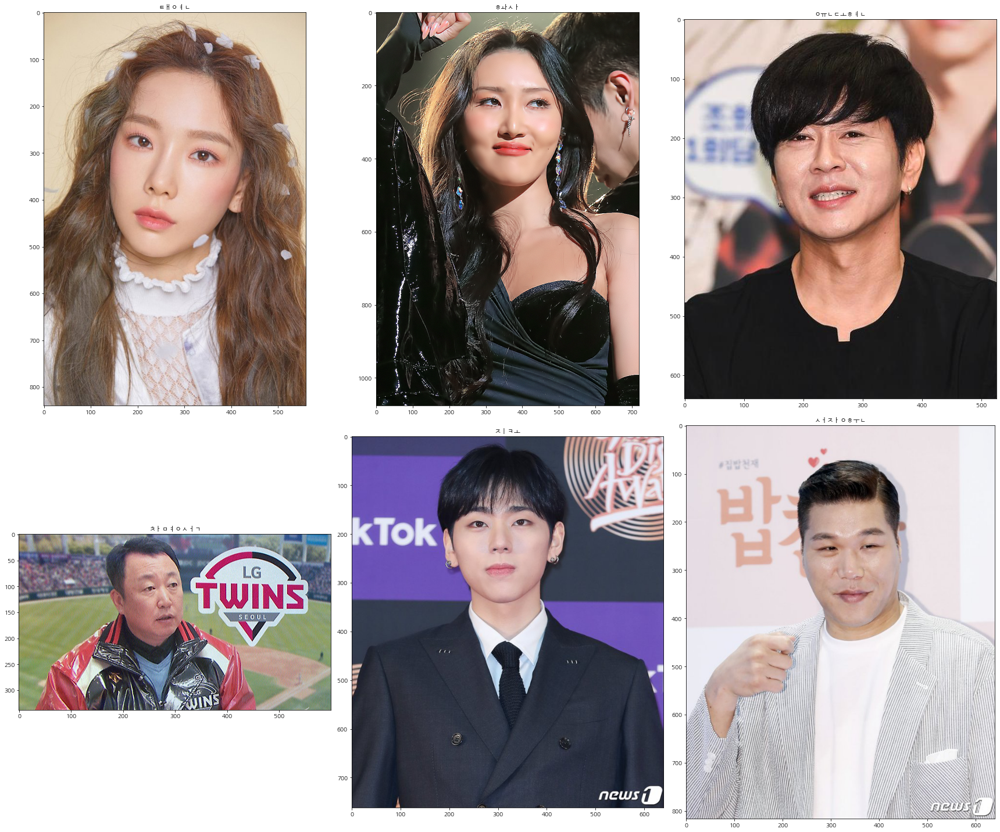

In [450]:
#Set figsize here
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24,20))

# flatten axes for easy iterating
for i, ax in enumerate(axes.flatten()):
    image = img.imread(file_list_after_convert[i])
    base = os.path.basename(file_list_after_convert[i])
    ax.set_title(os.path.splitext(base)[0])    
    ax.imshow(image)
plt.show()

fig.tight_layout()

## Face Recognition을 이용한 얼굴 인식
face recognition을 이용해서 얼굴을 찾고 찾은 얼굴 부분만 crop해서 시각화해보았다.

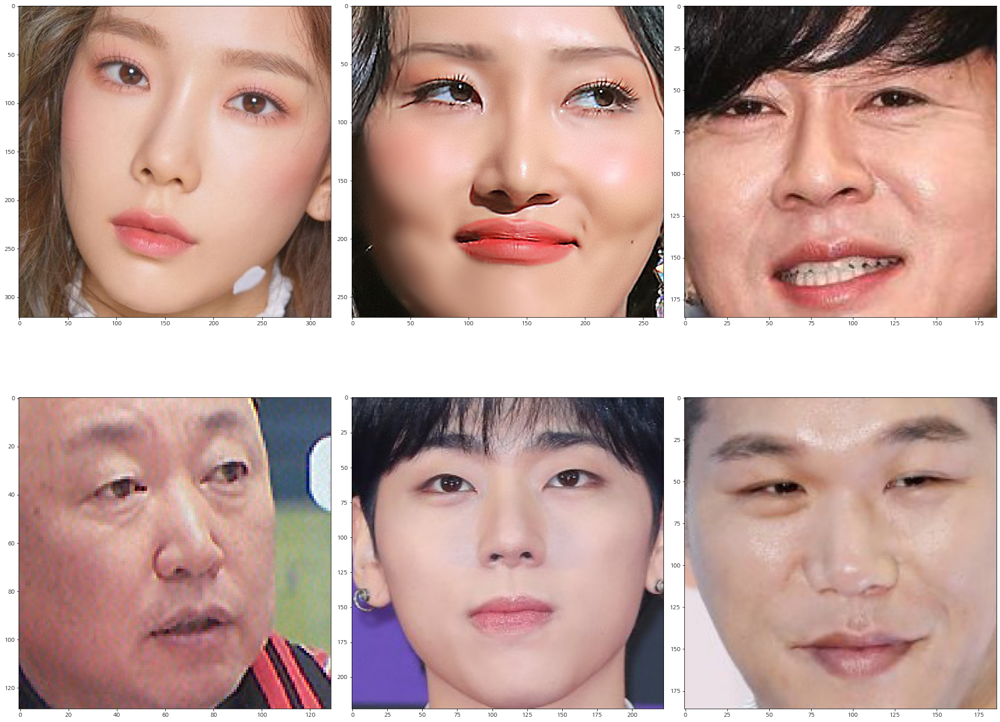

In [451]:
import face_recognition

#Set figsize here
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24,20))

# flatten axes for easy iterating
for i, ax in enumerate(axes.flatten()):
    image = face_recognition.load_image_file(file_list_after_convert[i])
    face_location = face_recognition.face_locations(image)    
    a,b,c,d = face_location[0]
    ax.imshow(image[a:c,d:b,:])
plt.show()

fig.tight_layout()

얼굴부분만 따로 crop하는 함수를 만들었다.

In [452]:
def get_cropped_face(img_path):
    image = face_recognition.load_image_file(img_path)
    face_location = face_recognition.face_locations(image)    
    a,b,c,d = face_location[0]
    return image[a:c,d:b,:]

만들어진 함수가 잘 동작하는지 테스트하였다.

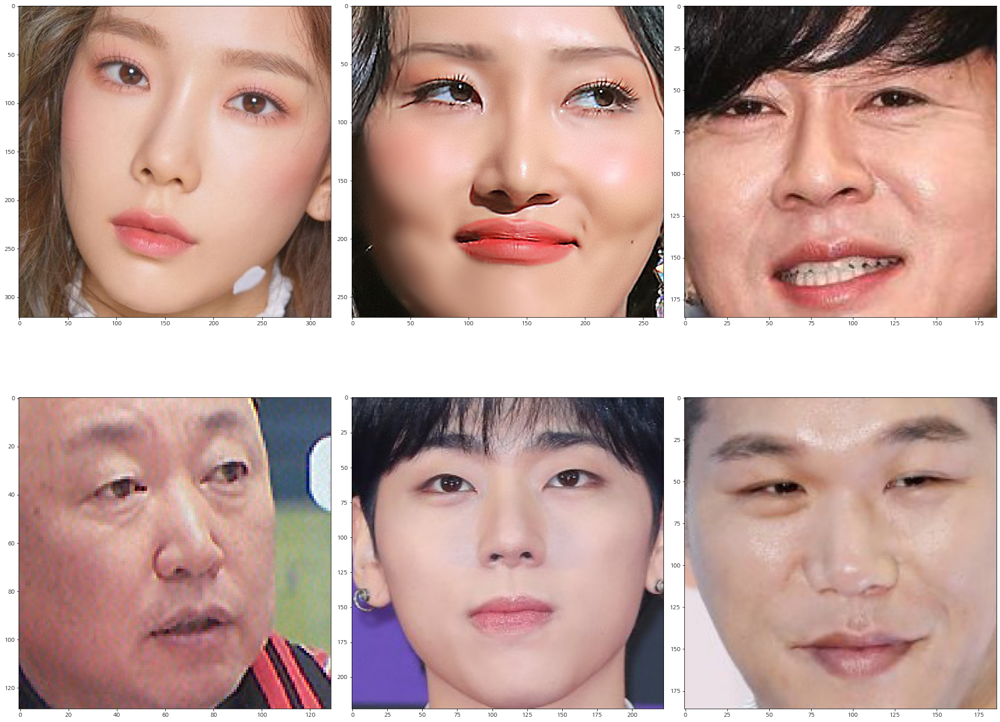

In [453]:
import face_recognition

#Set figsize here
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24,20))

# flatten axes for easy iterating
for i, ax in enumerate(axes.flatten()):
    # 새로 만든 함수를 가지고 시각화
    ax.imshow(get_cropped_face(file_list_after_convert[i]))
plt.show()

fig.tight_layout()

## 임베딩
face recognition으로 얻은 데이터를 벡터화하는 작업을 진행한다.

In [454]:
def get_face_embedding(face):
    return face_recognition.face_encodings(face)

In [455]:
face = get_cropped_face(file_list_after_convert[0])
face_vector = get_face_embedding(face)

In [456]:
face_vector

[array([-0.05832611,  0.08650121,  0.09609314, -0.08645427, -0.04536815,
         0.00911583, -0.09041593, -0.083923  ,  0.13654682, -0.16282591,
         0.23101933, -0.06544134, -0.22658628, -0.0451633 , -0.05203072,
         0.19644116, -0.17820568, -0.14273839, -0.03521199,  0.02405678,
         0.10089701,  0.07277459, -0.01784261,  0.01457554, -0.12162289,
        -0.30795228, -0.09869153, -0.027395  , -0.04413068, -0.10291066,
        -0.05202296,  0.06361919, -0.18417709,  0.02716298, -0.00758901,
         0.12781557,  0.00935094, -0.08867297,  0.14594853,  0.01699896,
        -0.28937352,  0.10548922,  0.02909858,  0.23222357,  0.16457024,
        -0.03816761, -0.01715928, -0.1753045 ,  0.08326229, -0.13974187,
         0.03850684,  0.16461825,  0.06933422,  0.06771764,  0.00946827,
        -0.11631443,  0.03686657,  0.08126064, -0.12411997, -0.03522221,
         0.09706895, -0.08108591,  0.03647789, -0.10451367,  0.11921875,
         0.05328177, -0.08073267, -0.23669644,  0.0

## 이미지 사전 만들기
임베딩을 거쳐 만들어진 벡터와 파일 이름을 가지고 dictionary를 만든다.

In [457]:
# 사진 별 임베딩을 해서 dictionary형태로 저장
def get_face_embedding_dict(file_list):    
    embedding_dict={}
    for filepath in file_list:        
        base = os.path.basename(filepath)
        person_name = os.path.splitext(base)[0]   
        print(f'{person_name}')
        face = get_cropped_face(filepath)
        embedding = get_face_embedding(face)        
        # face detect에 실패할 경우 embedding은 없는 리스트로 반환된다.
        if len(embedding) >0:
            embedding_dict[person_name] = embedding[0] 
    return embedding_dict

In [458]:
embedding_dict = get_face_embedding_dict(file_list_after_convert)
embedding_dict.keys()

태연
화사
윤도현
차명석
지코
서장훈
박진영
슬리피
이정재
이연걸
정민철
성룡
조인성
박용택
로제
트와이스쯔위
하정우
류승범
꽈두룹
지수
솔라
박항서
박서준
로저 무어
조원희
조달환
박휘순
슈가
강동원
신비
김경진
한기범
김영삼
주진모(올드)
저스틴 존슨
트와이스다현
김희철
김구라
황정민
권현빈
야마다 타카유키
김래원
클린트 이스트우드
박재정
나인뮤지스경리
이재용
윤경신
태양
리암 니슨
박정민
슬기
사쿠라
유희열
이말년
우기
잭 스페이더
trump
케빈 스페이시
유해진
김대명
레드벨벳웬디
온앤오프효진
씨잼
드웨인 존슨
잇지유나
이대형
정우성
최준석
김유정
케이
트와이스미나
서강준
돈스파이크
biden
세훈
켄 정
이천수
한효주
류준열
피어스 브로스넌
아이린
이영하
김태리
민니
티모시 달튼
티파니
성시경
전소미
송중기
트와이스모모
obama
수호
트와이스나연
영알남
이동휘
장도연
리아
이승철
트와이스정연
고창석
앤드류 응
아놀드 슈워제네거
김고은
유연석
여자아이들수진

IndexError: list index out of range

get_cropped_face에서 out of range 오류가 발생한다. 따라서 get_cropped_face에 예외처리를 진행했다.

In [459]:
def get_cropped_face(img_path):
    image = face_recognition.load_image_file(img_path)
    face_location = face_recognition.face_locations(image)    
    if len(face_location) <=0:
        return None
    a,b,c,d = face_location[0]
    return image[a:c,d:b,:]

In [460]:
# 사진 별 임베딩을 해서 dictionary형태로 저장
def get_face_embedding_dict(file_list):    
    embedding_dict={}
    for filepath in file_list:        
        base = os.path.basename(filepath)
        person_name = os.path.splitext(base)[0]   
        print(f'{person_name}')
        face = get_cropped_face(filepath)
        # face cropped에 실패할 경우 넘어간다.
        if face is None:
            continue
        embedding = get_face_embedding(face)        
        # face detect에 실패할 경우 embedding은 없는 리스트로 반환된다.
        if len(embedding) >0:
            embedding_dict[person_name] = embedding[0] 
    return embedding_dict

In [461]:
embedding_dict = get_face_embedding_dict(file_list_after_convert)

태연
화사
윤도현
차명석
지코
서장훈
박진영
슬리피
이정재
이연걸
정민철
성룡
조인성
박용택
로제
트와이스쯔위
하정우
류승범
꽈두룹
지수
솔라
박항서
박서준
로저 무어
조원희
조달환
박휘순
슈가
강동원
신비
김경진
한기범
김영삼
주진모(올드)
저스틴 존슨
트와이스다현
김희철
김구라
황정민
권현빈
야마다 타카유키
김래원
클린트 이스트우드
박재정
나인뮤지스경리
이재용
윤경신
태양
리암 니슨
박정민
슬기
사쿠라
유희열
이말년
우기
잭 스페이더
trump
케빈 스페이시
유해진
김대명
레드벨벳웬디
온앤오프효진
씨잼
드웨인 존슨
잇지유나
이대형
정우성
최준석
김유정
케이
트와이스미나
서강준
돈스파이크
biden
세훈
켄 정
이천수
한효주
류준열
피어스 브로스넌
아이린
이영하
김태리
민니
티모시 달튼
티파니
성시경
전소미
송중기
트와이스모모
obama
수호
트와이스나연
영알남
이동휘
장도연
리아
이승철
트와이스정연
고창석
앤드류 응
아놀드 슈워제네거
김고은
유연석
여자아이들수진

In [462]:
embedding_dict['태연']

array([-0.05832611,  0.08650121,  0.09609314, -0.08645427, -0.04536815,
        0.00911583, -0.09041593, -0.083923  ,  0.13654682, -0.16282591,
        0.23101933, -0.06544134, -0.22658628, -0.0451633 , -0.05203072,
        0.19644116, -0.17820568, -0.14273839, -0.03521199,  0.02405678,
        0.10089701,  0.07277459, -0.01784261,  0.01457554, -0.12162289,
       -0.30795228, -0.09869153, -0.027395  , -0.04413068, -0.10291066,
       -0.05202296,  0.06361919, -0.18417709,  0.02716298, -0.00758901,
        0.12781557,  0.00935094, -0.08867297,  0.14594853,  0.01699896,
       -0.28937352,  0.10548922,  0.02909858,  0.23222357,  0.16457024,
       -0.03816761, -0.01715928, -0.1753045 ,  0.08326229, -0.13974187,
        0.03850684,  0.16461825,  0.06933422,  0.06771764,  0.00946827,
       -0.11631443,  0.03686657,  0.08126064, -0.12411997, -0.03522221,
        0.09706895, -0.08108591,  0.03647789, -0.10451367,  0.11921875,
        0.05328177, -0.08073267, -0.23669644,  0.09432068, -0.15

## 내 사진끼리 임베딩 벡터 거리 구하기

In [463]:
my_face_path = os.getenv('HOME')+'/aiffel/face_embedding/my_face/*'
my_face_list = glob.glob(my_face_path)

이미지를 얼굴부분만 crop해서 시각화

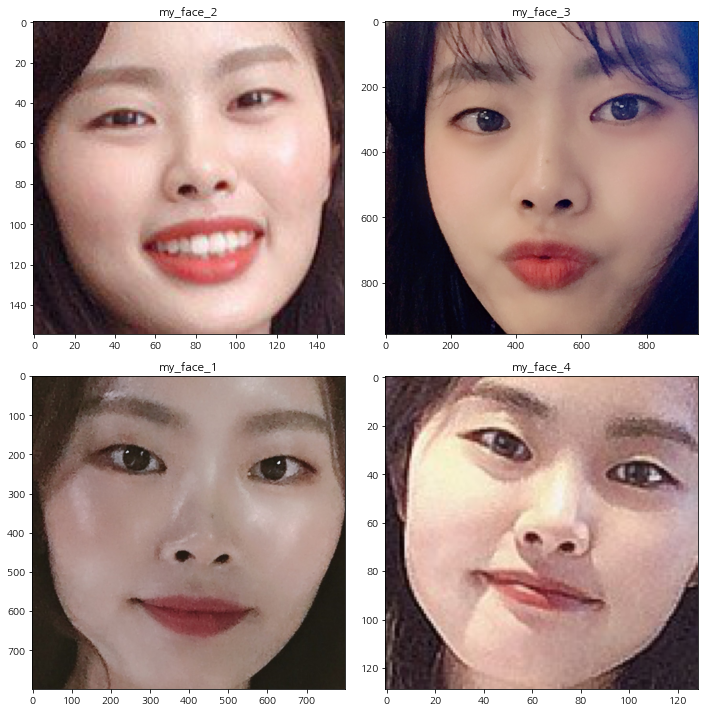

In [464]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10,10))

for i, ax in enumerate(axes.flatten()):
    ax.imshow(get_cropped_face(my_face_list[i]))
    base = os.path.basename(my_face_list[i])
    ax.set_title(os.path.splitext(base)[0])  
plt.show()

fig.tight_layout()

이미지를 임베딩해서 내 사진끼리의 유사도를 계산한다.

In [465]:
my_face_dict = get_face_embedding_dict(my_face_list)
my_face_dict

my_face_2
my_face_3
my_face_1
my_face_4


{'my_face_2': array([-0.14024897,  0.06507736,  0.04001568, -0.12307651, -0.1231418 ,
        -0.03154144, -0.09148531, -0.08168456,  0.19123623, -0.14858863,
         0.20883255, -0.0916845 , -0.17115229, -0.0388158 , -0.10452872,
         0.18152294, -0.18828873, -0.15246579,  0.02719287, -0.00061843,
         0.13293189,  0.00206804, -0.05368203,  0.0271797 , -0.09598155,
        -0.35365146, -0.138789  , -0.04377382, -0.06047536, -0.06747057,
         0.0143    ,  0.03199799, -0.21590793,  0.00914278, -0.02803479,
         0.08345419, -0.0152304 , -0.10956156,  0.0961588 , -0.01258783,
        -0.26015472,  0.01220229,  0.06158984,  0.20124665,  0.15366957,
        -0.01778286, -0.01339699, -0.13354781,  0.10458537, -0.13574998,
        -0.02297733,  0.16605923,  0.02148201,  0.03980511,  0.00954527,
        -0.07993601,  0.03902314,  0.12524334, -0.0901048 , -0.01480612,
         0.08330198, -0.07548904, -0.02870695, -0.1208052 ,  0.19734013,
         0.10630027, -0.09921651, -0.2

In [466]:
import itertools
import numpy as np
for x1, x2 in itertools.combinations(my_face_dict.keys(), 2):
    distance = np.linalg.norm(my_face_dict[x1]-my_face_dict[x2], ord=2)
    print(f'{x1}와 {x2}의 유사도 = {distance}')

my_face_2와 my_face_3의 유사도 = 0.3154191107686926
my_face_2와 my_face_1의 유사도 = 0.30184848898901984
my_face_2와 my_face_4의 유사도 = 0.31363491141135375
my_face_3와 my_face_1의 유사도 = 0.3383614934063311
my_face_3와 my_face_4의 유사도 = 0.3750832480931077
my_face_1와 my_face_4의 유사도 = 0.2818748977494544


유사도 확인 결과 대체적으로 내 사진끼리는 유사한 값을 가지고 있음을 알 수 있다. 

유사도 계산하는 기능을 함수도 분리했다.

In [467]:
def get_l2_distance(embedding_vector1, embedding_vector2):
    return np.linalg.norm(embedding_vector1-embedding_vector2, ord=2)

## input image와 유사도 계산하는 함수
1. input할 이미지 임베딩 벡터를 미리 지정하고
2. 비교할 celebrity 이미지는 호출 시 이름을 인자로 넣는다.

In [468]:
def get_sort_key_function(input_image_vector):
    def get_distance_from_input(celebrity_name):
        celebrity_vector = embedding_dict[celebrity_name]
        return get_l2_distance(input_image_vector, celebrity_vector)
    return get_distance_from_input

## input image와 유사한 celebrity 추출하는 함수(top5)
기본 top 5개의 input image와 유사한 celebrity 이미지를 추출한다.

In [469]:
def get_nearest_face(input_vector, top=5):
    sort_key_function = get_sort_key_function(input_vector)
    sorted_face = dict(sorted(embedding_dict.items(), key=lambda x:sort_key_function(x[0])))
    result = list(sorted_face.keys())[:5]
    for idx, celebrity in enumerate(result, 1):
        print(f'TOP{idx}: {celebrity} -> {sort_key_function(celebrity)}')        
    return list(sorted_face.keys())[:5]

In [470]:
select_celebrities = get_nearest_face(my_face_dict['my_face_1'])

TOP1: 류진 -> 0.38220531313530726
TOP2: 지호 -> 0.39430346195209603
TOP3: 사쿠라 -> 0.39689984828923003
TOP4: 서현진 -> 0.396994784773349
TOP5: 태연 -> 0.3970518903720394


다른 내 사진도 비슷한 결과가 나오는지 확인해보자.

In [471]:
for key, input_image_vector in my_face_dict.items():
    print(f'{key}')
    select_celebrities = get_nearest_face(input_image_vector)    

my_face_2
TOP1: 제니 -> 0.36473774068391845
TOP2: 사쿠라 -> 0.37778098956045547
TOP3: 아이유 -> 0.3857115165296282
TOP4: 트와이스사나 -> 0.3879918647150982
TOP5: RM -> 0.3928445461499005
my_face_3
TOP1: 강미나 -> 0.3140311342434332
TOP2: RM -> 0.3818724438130964
TOP3: 승희 -> 0.3899556838498991
TOP4: 사쿠라 -> 0.39106959123747953
TOP5: 제니 -> 0.3920873886553683
my_face_1
TOP1: 류진 -> 0.38220531313530726
TOP2: 지호 -> 0.39430346195209603
TOP3: 사쿠라 -> 0.39689984828923003
TOP4: 서현진 -> 0.396994784773349
TOP5: 태연 -> 0.3970518903720394
my_face_4
TOP1: 지호 -> 0.3625070191776176
TOP2: 트와이스쯔위 -> 0.37888554869751323
TOP3: 강미나 -> 0.3814843320732854
TOP4: 사쿠라 -> 0.38272077098337814
TOP5: 류진 -> 0.3843750836602648


## 경로를 주고 닮은 연예인 찾기

In [472]:
import ipywidgets as widgets

In [473]:
def display_gui():
    input_path = widgets.Text()
    submit_button = widgets.Button(description='Submit')
    output = widgets.Output()
    display(input_path, submit_button, output)

    def visualization_closer(celebrities_name):
        celebrity_path = os.getenv('HOME')+'/aiffel/face_embedding/celebrity/'
        #Set figsize here
        row_count = len(celebrities_name)//2
        fig, axes = plt.subplots(nrows=row_count, ncols=row_count+len(celebrities_name)%2, figsize=(24,20))
        # flatten axes for easy iterating
        for i, ax in enumerate(axes.flatten()):
            if len(celebrities_name) <= i:
                return
            image_name = celebrities_name[i]
            image = img.imread(os.path.join(celebrity_path, f'{image_name}.jpg'))
            ax.set_title(image_name)    
            ax.imshow(image)
        plt.show()
        fig.tight_layout()

    def on_button_clicked(b):
        with output:
            if len(input_path.value) == 0:
                return
            input_vector = get_face_embedding(get_cropped_face(input_path.value))
            image = img.imread(input_path.value)
            plt.title('원본')
            plt.imshow(image)
            select_celebrities = get_nearest_face(input_vector)                    
            visualization_closer(select_celebrities)

    submit_button.on_click(on_button_clicked)

### 내 사진을 사용하여 테스트

Text(value='')

Button(description='Submit', style=ButtonStyle())

Output()

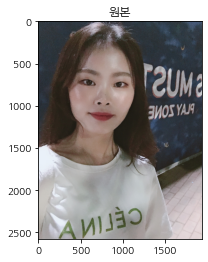

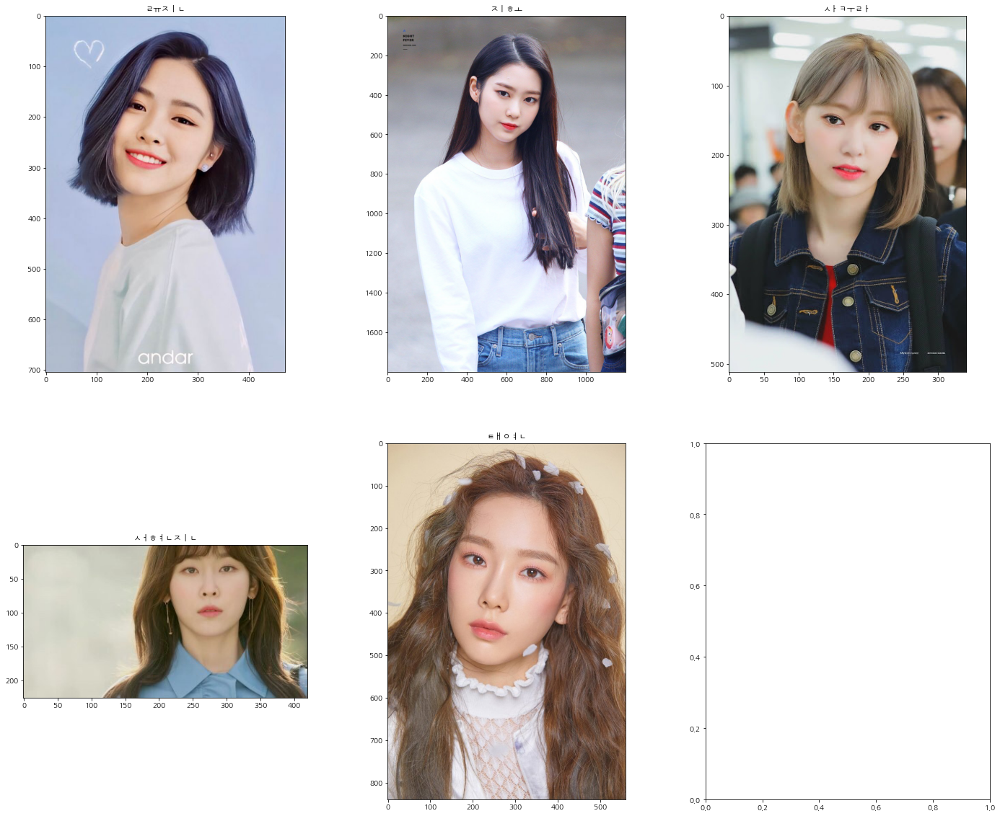

In [474]:
display_gui()

# 회고

## 1) 배운 점
- 이번 노드를 통해서 자연어 뿐만 아니라 이미지도 임베딩할 수 있다는 것을 알았다.
- ipynb 안에 gui 기능을 넣는 방법을 배웠다.
- 이미지 간 유사도를 계산하는 방법을 배웠다.

## 2) 아쉬운 점 및 궁금한 점
- 웹페이지로 사진을 넣으면 닮은 연예인을 보여주는 것을 만들고 싶었는데 웹페이지를 만드는게 생각만큼 안되었던 것 같다.

# Reference
* https://pinkwink.kr/1279